# Segmentação das vias aéreas

**Teste de utilidade:** verifica se o nosso gerador pode ser usado como *feature extractor*.

## Definições iniciais

In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from scipy.linalg import sqrtm
from tqdm import trange
import random
random.seed(5)
import matplotlib.pyplot as plt
import numpy as np
import os
import csv

In [19]:
from datasets import processedCTData
from model import Generator
from utils import clean_directory, plt_save_example_airways_img

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device == "cuda":
    num_workers = torch.cuda.device_count() * 4

## Parâmetros de treinamento

In [16]:
#ÚNICA CÉLULA QUE PRECISA SER MODIFICADA PARA DEFINIR O TREINO

#bacthes
batch_size_train = 20
batch_size_validation = 8
#learning param
n_epochs = 50
initial_lr = 1e-4
epoch_to_switch_to_lr_scheduler = 100
#safe save
step_to_safe_save_models = 10
#save results directory
new_model = True
dir_save_results = './unet_dice_loss/'
dir_save_models = dir_save_results+'models/'
dir_save_example = dir_save_results+'examples/'
dir_save_test = dir_save_results+'test/'
name_model = 'unet_dice_loss'
processed_data_folder = 'C:/Users/julia/OneDrive/Dados_escolinha/data_unet'

## Dados

In [6]:
dataset_train = processedCTData(processed_data_folder=processed_data_folder,mode='seg_train',start=0, end=100)
dataset_validation = processedCTData(processed_data_folder=processed_data_folder,mode='seg_val',start=0,end=10)

In [7]:
print(dataset_train.__len__(), dataset_validation.__len__())

100 10


In [8]:
data_loader_train = DataLoader(dataset_train, batch_size=batch_size_train, shuffle=True)
data_loader_validation = DataLoader(dataset_validation, batch_size=batch_size_validation, shuffle=True)

In [9]:
data_ct = []
data_airway = []
data_mask = []
for i in range(10):
    ct, airway, lung = dataset_train.__getitem__(i)
    data_ct.append(ct.detach().numpy())
    data_airway.append(airway.detach().numpy())
    data_mask.append(lung.detach().numpy())

np.shape(np.squeeze(data_airway))

(10, 512, 512)

## Modelo

In [10]:
unet = Generator().to(device) # mesma arquiterua do gerador

## Optimizer

In [11]:
unet_opt = torch.optim.AdamW(unet.parameters(), lr=initial_lr, betas=(0.5, 0.999))
unet_scheduler = torch.optim.lr_scheduler.LinearLR(unet_opt, start_factor=1.0, end_factor=0.0, total_iters=50)

## Loss

In [11]:
from torch import tensor
from torchmetrics.classification import Dice
preds  = tensor([2, 0, 2, 1])
target = tensor([1, 1, 2, 0])
dice = Dice(average='micro')
dice(preds, target)

tensor(0.2500)

In [16]:
import torch
import torch.nn as nn

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.sigmoid(inputs)  # Apply sigmoid to get predictions
        inputs_flat = inputs.view(-1)
        targets_flat = targets.view(-1)
        intersection = (inputs_flat * targets_flat).sum()
        
        dice = (2. * intersection + self.smooth) / (inputs_flat.sum() + targets_flat.sum() + self.smooth)
        return 1 - dice

# Example usage:
criterion = DiceLoss()
# loss = criterion(predictions, targets)

In [19]:
ct, airway, lung = dataset_train.__getitem__(1)
inputs = airway  # Example input tensor
ct, airway, lung = dataset_train.__getitem__(50)
targets = airway  # Example target tensor
loss = criterion(inputs, targets)
print(loss)

tensor(0.9971)


In [17]:
def get_unet_loss(unet,criterion,target,input,device):
    out_unet = unet(input) # tensor de saída da unet
    loss = criterion(np.squeeze(out_unet),target)

    return loss

In [11]:
# Binary Cross-Entropy Loss
criterion = torch.nn.BCEWithLogitsLoss()

## Loop de treinamento

In [19]:
from tqdm import trange
import torch
import gc
from utils import plt_save_example_synth_img

def run_train_epoch(unet, criterion, data_loader, unet_opt, epoch, device):

    mean_loss = 0 
    counter_batches_used_to_upd = 0   

    with trange(len(data_loader), desc='Train Loop') as progress_bar:
        for batch_idx, batch in zip(progress_bar, data_loader):

            input_img_batch = batch[0]
            input_airway_batch = batch[1]

            input_img = input_img_batch.to(device)
            input_airway = input_airway_batch.to(device)
            
            unet_opt.zero_grad()
            out_unet = unet(input_img) # predict
            loss = criterion(np.squeeze(out_unet),input_airway) # calculate loss
            if loss.requires_grad:
                loss.backward()  # Compute gradients
                unet_opt.step()  # Update model parameters
            else:
                print("Loss does not require gradients. Check your input tensors.")
            '''print("get_unet_loss")
            loss.backward(retain_graph=True)
            print("loss.backward")
            unet_opt.step()
            print("unet_opt.step")'''
            mean_loss = mean_loss + loss.item() 
            print(mean_loss)
            counter_batches_used_to_upd += 1

            progress_bar.set_postfix(
                desc=(f'[epoch: {epoch + 1:d}], iteration: {batch_idx:d}/{len(data_loader):d},'
                      f'loss: {(mean_loss / counter_batches_used_to_upd)}'))
    
    return (mean_loss / counter_batches_used_to_upd)

def run_validation_epoch(unet, criterion, data_loader, epoch, device):

    mean_loss = 0

    with torch.no_grad():
        torch.cuda.empty_cache()
        gc.collect()
        with trange(len(data_loader), desc='Validation Loop') as progress_bar:
            for batch_idx, batch in zip(progress_bar, data_loader):

                input_img_batch = batch[0]
                input_airway_batch = batch[1]

                input_img = input_img_batch.to(device)
                input_airway = input_airway_batch.to(device)
                loss = get_unet_loss(unet,criterion,input_airway,input_img,device)
                mean_loss = mean_loss + loss.item() 

                progress_bar.set_postfix(
                desc=(f'[epoch: {epoch + 1:d}], iteration: {batch_idx:d}/{len(data_loader):d},'
                      f'loss: {mean_loss / (batch_idx + 1)}'))

    return (mean_loss/len(data_loader))


def plt_save_example_airways_img(input_img_ref, input_airway_ref, gen_seg_ref, epoch, save_dir): 
    fig, ax = plt.subplots(1, 3, figsize=(18, 4))
    ax.flat[0].imshow(input_img_ref, cmap='gray')
    ax.flat[1].imshow(input_airway_ref, cmap='gray')
    ax.flat[2].imshow(gen_seg_ref, cmap='gray')
    ax.flat[0].set_title('Original Input')
    ax.flat[1].set_title('Expected Airway')
    ax.flat[2].set_title('Generated Airway')
    plt.savefig(save_dir+'example_generated_epoch_'+str(epoch)+'.png')


def valid_on_the_fly(unet, data_loader,epoch,save_dir,device):

    unet.eval()

    with torch.no_grad():
        for batch in data_loader:
            input_img_batch = batch[0]
            input_airway_batch = batch[1]
            
            input_img = input_img_batch[:1,:,:,:].to(device)
            input_airway = input_airway_batch[:1,:,:].to(device)
           
            gen_seg = unet(input_img)
            break

        plt_save_example_airways_img(input_img_ref=input_img[0,0,:,:].detach().cpu().numpy(), 
                                    input_airway_ref=input_airway[0,:,:].detach().cpu().numpy(), 
                                    gen_seg_ref=gen_seg[0,0,:,:].detach().cpu().numpy(), 
                                    epoch=epoch+1, 
                                    save_dir=save_dir)

In [22]:
mean_loss_train_list = []
mean_loss_validation_list = []
save_count_idx = 0

os.makedirs(dir_save_results, exist_ok=True)
if new_model == True:
    clean_directory(dir_save_results)
os.makedirs(dir_save_models, exist_ok=True)
os.makedirs(dir_save_example, exist_ok=True)
if new_model == True:
    with open(dir_save_results+'losses.csv', 'w', newline='') as csvfile:
        fieldnames = ['LossTrain', 'LossVal']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

In [ ]:
for epoch in range(n_epochs):

    loss_train = run_train_epoch(unet=unet, criterion=criterion, 
                                        data_loader=data_loader_train, unet_opt=unet_opt, 
                                        epoch=epoch,  device=device)

    mean_loss_train_list.append(loss_train)

    loss_validation = run_validation_epoch(unet=unet, criterion=criterion, data_loader=data_loader_validation, epoch=epoch, device=device)

    mean_loss_validation_list.append(loss_validation)

    valid_on_the_fly(unet=unet, data_loader=data_loader_validation, epoch=epoch,save_dir=dir_save_example,device=device)

    if epoch%step_to_safe_save_models == 0:
        torch.save(unet.state_dict(), f"{dir_save_models}{name_model}_last_lr_{unet_scheduler.get_last_lr()[0]}_savesafe.pt")
        with open(dir_save_results+'losses.csv', mode='a', newline='') as file:
            writer = csv.writer(file)
            for i in range(save_count_idx,epoch+1):
                writer.writerow([mean_loss_train_list[i], mean_loss_validation_list[i]])
        save_count_idx = epoch+1

    if epoch >= epoch_to_switch_to_lr_scheduler:
        unet_scheduler.step()
        print("Current learning rate: ", unet_scheduler.get_last_lr()[0])


Train Loop:  20%|██        | 1/5 [00:43<02:55, 43.99s/it, desc=[epoch: 1], iteration: 0/5,loss: 0.9970231652259827]

0.9970231652259827


Train Loop:  40%|████      | 2/5 [01:09<01:39, 33.12s/it, desc=[epoch: 1], iteration: 1/5,loss: 0.9969688653945923]

1.9939377307891846


Train Loop:  60%|██████    | 3/5 [01:29<00:54, 27.29s/it, desc=[epoch: 1], iteration: 2/5,loss: 0.9968628088633219]

2.990588426589966


Train Loop:  80%|████████  | 4/5 [01:46<00:23, 23.12s/it, desc=[epoch: 1], iteration: 3/5,loss: 0.9968725442886353]

3.987490177154541


Train Loop: 100%|██████████| 5/5 [02:03<00:00, 24.75s/it, desc=[epoch: 1], iteration: 4/5,loss: 0.9969548344612121]

4.984774172306061



Train Loop:  20%|██        | 1/5 [00:18<01:15, 18.80s/it, desc=[epoch: 2], iteration: 0/5,loss: 0.9971798062324524]

0.9971798062324524


Train Loop:  40%|████      | 2/5 [00:35<00:52, 17.52s/it, desc=[epoch: 2], iteration: 1/5,loss: 0.9970598220825195]

1.994119644165039


Train Loop:  60%|██████    | 3/5 [00:51<00:34, 17.08s/it, desc=[epoch: 2], iteration: 2/5,loss: 0.997054656346639] 

2.991163969039917


Train Loop:  80%|████████  | 4/5 [01:08<00:16, 16.73s/it, desc=[epoch: 2], iteration: 3/5,loss: 0.9969799518585205]

3.987919807434082


Train Loop: 100%|██████████| 5/5 [01:24<00:00, 16.87s/it, desc=[epoch: 2], iteration: 4/5,loss: 0.9969548106193542]

4.984774053096771



Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.78s/it, desc=[epoch: 3], iteration: 0/5,loss: 0.9966838359832764]

0.9966838359832764


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.47s/it, desc=[epoch: 3], iteration: 1/5,loss: 0.9969146251678467]

1.9938292503356934


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.23s/it, desc=[epoch: 3], iteration: 2/5,loss: 0.9969391226768494]

2.990817368030548


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.26s/it, desc=[epoch: 3], iteration: 3/5,loss: 0.9968952834606171]

3.9875811338424683


Train Loop: 100%|██████████| 5/5 [01:21<00:00, 16.27s/it, desc=[epoch: 3], iteration: 4/5,loss: 0.9969548225402832]

4.984774112701416



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.64s/it, desc=[epoch: 4], iteration: 0/5,loss: 0.9963517785072327]

0.9963517785072327


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.51s/it, desc=[epoch: 4], iteration: 1/5,loss: 0.9967018067836761]

1.9934036135673523


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.38s/it, desc=[epoch: 4], iteration: 2/5,loss: 0.9968298077583313]

2.990489423274994


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.37s/it, desc=[epoch: 4], iteration: 3/5,loss: 0.9968715459108353]

3.987486183643341


Train Loop: 100%|██████████| 5/5 [01:22<00:00, 16.41s/it, desc=[epoch: 4], iteration: 4/5,loss: 0.9969549417495728]

4.984774708747864



Train Loop:  20%|██        | 1/5 [00:22<01:28, 22.19s/it, desc=[epoch: 5], iteration: 0/5,loss: 0.9970974922180176]

0.9970974922180176


Train Loop:  40%|████      | 2/5 [00:41<01:02, 20.67s/it, desc=[epoch: 5], iteration: 1/5,loss: 0.9970940947532654]

1.9941881895065308


Train Loop:  60%|██████    | 3/5 [01:00<00:39, 19.72s/it, desc=[epoch: 5], iteration: 2/5,loss: 0.9969576001167297]

2.990872800350189


Train Loop:  80%|████████  | 4/5 [01:19<00:19, 19.60s/it, desc=[epoch: 5], iteration: 3/5,loss: 0.9969374984502792]

3.987749993801117


Train Loop: 100%|██████████| 5/5 [01:37<00:00, 19.52s/it, desc=[epoch: 5], iteration: 4/5,loss: 0.9969547867774964]

4.984773933887482



Train Loop:  20%|██        | 1/5 [00:30<02:03, 30.96s/it, desc=[epoch: 6], iteration: 0/5,loss: 0.9966638684272766]

0.9966638684272766


Train Loop:  40%|████      | 2/5 [00:54<01:20, 26.88s/it, desc=[epoch: 6], iteration: 1/5,loss: 0.9968593716621399]

1.9937187433242798


Train Loop:  60%|██████    | 3/5 [01:19<00:51, 25.63s/it, desc=[epoch: 6], iteration: 2/5,loss: 0.9969748655954996]

2.990924596786499


Train Loop:  80%|████████  | 4/5 [01:39<00:23, 23.40s/it, desc=[epoch: 6], iteration: 3/5,loss: 0.996971383690834] 

3.987885534763336


Train Loop: 100%|██████████| 5/5 [02:03<00:00, 24.74s/it, desc=[epoch: 6], iteration: 4/5,loss: 0.9969548106193542]

4.984774053096771



Train Loop:  20%|██        | 1/5 [00:26<01:45, 26.39s/it, desc=[epoch: 7], iteration: 0/5,loss: 0.9970722198486328]

0.9970722198486328


Train Loop:  40%|████      | 2/5 [00:51<01:17, 25.87s/it, desc=[epoch: 7], iteration: 1/5,loss: 0.997040331363678] 

1.994080662727356


Train Loop:  60%|██████    | 3/5 [01:13<00:47, 23.98s/it, desc=[epoch: 7], iteration: 2/5,loss: 0.9969399770100912]

2.9908199310302734


Train Loop:  80%|████████  | 4/5 [01:35<00:22, 22.97s/it, desc=[epoch: 7], iteration: 3/5,loss: 0.9969881325960159]

3.9879525303840637


Train Loop: 100%|██████████| 5/5 [01:56<00:00, 23.35s/it, desc=[epoch: 7], iteration: 4/5,loss: 0.9969547867774964]

4.984773933887482



Train Loop:  20%|██        | 1/5 [00:23<01:34, 23.55s/it, desc=[epoch: 8], iteration: 0/5,loss: 0.9968594908714294]

0.9968594908714294


Train Loop:  40%|████      | 2/5 [00:46<01:09, 23.16s/it, desc=[epoch: 8], iteration: 1/5,loss: 0.9967396557331085]

1.993479311466217


Train Loop:  60%|██████    | 3/5 [01:07<00:44, 22.02s/it, desc=[epoch: 8], iteration: 2/5,loss: 0.9968745311101278]

2.9906235933303833


Train Loop:  80%|████████  | 4/5 [01:29<00:22, 22.11s/it, desc=[epoch: 8], iteration: 3/5,loss: 0.9968799203634262]

3.987519681453705


Train Loop: 100%|██████████| 5/5 [01:50<00:00, 22.06s/it, desc=[epoch: 8], iteration: 4/5,loss: 0.9969548463821412]

4.984774231910706



Train Loop:  20%|██        | 1/5 [00:22<01:30, 22.69s/it, desc=[epoch: 9], iteration: 0/5,loss: 0.997099757194519]

0.997099757194519


Train Loop:  40%|████      | 2/5 [00:42<01:02, 20.89s/it, desc=[epoch: 9], iteration: 1/5,loss: 0.9968850314617157]

1.9937700629234314


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.68s/it, desc=[epoch: 9], iteration: 2/5,loss: 0.9968877037366232]

2.9906631112098694


Train Loop:  80%|████████  | 4/5 [01:25<00:21, 21.38s/it, desc=[epoch: 9], iteration: 3/5,loss: 0.9968983829021454]

3.9875935316085815


Train Loop: 100%|██████████| 5/5 [01:45<00:00, 21.04s/it, desc=[epoch: 9], iteration: 4/5,loss: 0.9969548106193542]

4.984774053096771



Train Loop:  20%|██        | 1/5 [00:22<01:29, 22.46s/it, desc=[epoch: 10], iteration: 0/5,loss: 0.9969635605812073]

0.9969635605812073


Train Loop:  40%|████      | 2/5 [00:44<01:05, 21.94s/it, desc=[epoch: 10], iteration: 1/5,loss: 0.9970246851444244]

1.9940493702888489


Train Loop:  60%|██████    | 3/5 [01:05<00:43, 21.63s/it, desc=[epoch: 10], iteration: 2/5,loss: 0.9969987869262695]

2.9909963607788086


Train Loop:  80%|████████  | 4/5 [01:26<00:21, 21.64s/it, desc=[epoch: 10], iteration: 3/5,loss: 0.9969829171895981]

3.9879316687583923


Train Loop: 100%|██████████| 5/5 [01:48<00:00, 21.66s/it, desc=[epoch: 10], iteration: 4/5,loss: 0.9969547629356384]

4.984773814678192



Train Loop:  20%|██        | 1/5 [00:26<01:44, 26.21s/it, desc=[epoch: 11], iteration: 0/5,loss: 0.9965881705284119]

0.9965881705284119


Train Loop:  40%|████      | 2/5 [00:51<01:17, 25.79s/it, desc=[epoch: 11], iteration: 1/5,loss: 0.9969000220298767]

1.9938000440597534


Train Loop:  60%|██████    | 3/5 [01:11<00:45, 22.94s/it, desc=[epoch: 11], iteration: 2/5,loss: 0.9969254732131958]

2.9907764196395874


Train Loop:  80%|████████  | 4/5 [01:29<00:21, 21.13s/it, desc=[epoch: 11], iteration: 3/5,loss: 0.9969084113836288]

3.9876336455345154


Train Loop: 100%|██████████| 5/5 [01:46<00:00, 21.33s/it, desc=[epoch: 11], iteration: 4/5,loss: 0.9969548344612121]

4.984774172306061



Train Loop:  20%|██        | 1/5 [00:18<01:12, 18.19s/it, desc=[epoch: 12], iteration: 0/5,loss: 0.996767520904541]

0.996767520904541


Train Loop:  40%|████      | 2/5 [00:34<00:51, 17.07s/it, desc=[epoch: 12], iteration: 1/5,loss: 0.9969398677349091]

1.9938797354698181


Train Loop:  60%|██████    | 3/5 [00:51<00:33, 16.83s/it, desc=[epoch: 12], iteration: 2/5,loss: 0.9969841043154398]

2.9909523129463196


Train Loop:  80%|████████  | 4/5 [01:07<00:16, 16.58s/it, desc=[epoch: 12], iteration: 3/5,loss: 0.9969264715909958]

3.987705886363983


Train Loop: 100%|██████████| 5/5 [01:23<00:00, 16.69s/it, desc=[epoch: 12], iteration: 4/5,loss: 0.9969547986984253]

4.9847739934921265



Train Loop:  20%|██        | 1/5 [00:17<01:08, 17.20s/it, desc=[epoch: 13], iteration: 0/5,loss: 0.9968127608299255]

0.9968127608299255


Train Loop:  40%|████      | 2/5 [00:33<00:50, 16.76s/it, desc=[epoch: 13], iteration: 1/5,loss: 0.9969508051872253]

1.9939016103744507


Train Loop:  60%|██████    | 3/5 [00:50<00:33, 16.60s/it, desc=[epoch: 13], iteration: 2/5,loss: 0.9969247778256735]

2.9907743334770203


Train Loop:  80%|████████  | 4/5 [01:06<00:16, 16.38s/it, desc=[epoch: 13], iteration: 3/5,loss: 0.9969848543405533]

3.987939417362213


Train Loop: 100%|██████████| 5/5 [01:22<00:00, 16.42s/it, desc=[epoch: 13], iteration: 4/5,loss: 0.9969548106193542]

4.984774053096771



Train Loop:  20%|██        | 1/5 [00:17<01:08, 17.16s/it, desc=[epoch: 14], iteration: 0/5,loss: 0.9970594048500061]

0.9970594048500061


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.57s/it, desc=[epoch: 14], iteration: 1/5,loss: 0.9968688189983368]

1.9937376379966736


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.37s/it, desc=[epoch: 14], iteration: 2/5,loss: 0.9969690839449564]

2.9909072518348694


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.23s/it, desc=[epoch: 14], iteration: 3/5,loss: 0.996979683637619] 

3.987918734550476


Train Loop: 100%|██████████| 5/5 [01:21<00:00, 16.30s/it, desc=[epoch: 14], iteration: 4/5,loss: 0.9969548225402832]

4.984774112701416



Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.86s/it, desc=[epoch: 15], iteration: 0/5,loss: 0.9966574907302856]

0.9966574907302856


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.21s/it, desc=[epoch: 15], iteration: 1/5,loss: 0.9970166385173798]

1.9940332770347595


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.12s/it, desc=[epoch: 15], iteration: 2/5,loss: 0.9969582358996073]

2.990874707698822


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.11s/it, desc=[epoch: 15], iteration: 3/5,loss: 0.9969499558210373]

3.987799823284149


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.12s/it, desc=[epoch: 15], iteration: 4/5,loss: 0.996954870223999] 

4.984774351119995



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.29s/it, desc=[epoch: 16], iteration: 0/5,loss: 0.9969473481178284]

0.9969473481178284


Train Loop:  40%|████      | 2/5 [00:31<00:47, 15.87s/it, desc=[epoch: 16], iteration: 1/5,loss: 0.9969873428344727]

1.9939746856689453


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.60s/it, desc=[epoch: 16], iteration: 2/5,loss: 0.9968956112861633]

2.99068683385849


Train Loop:  80%|████████  | 4/5 [01:02<00:15, 15.52s/it, desc=[epoch: 16], iteration: 3/5,loss: 0.996929869055748] 

3.987719476222992


Train Loop: 100%|██████████| 5/5 [01:17<00:00, 15.53s/it, desc=[epoch: 16], iteration: 4/5,loss: 0.9969547986984253]

4.9847739934921265



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.55s/it, desc=[epoch: 17], iteration: 0/5,loss: 0.9970729947090149]

0.9970729947090149


Train Loop:  40%|████      | 2/5 [00:31<00:47, 15.82s/it, desc=[epoch: 17], iteration: 1/5,loss: 0.9969123303890228]

1.9938246607780457


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.64s/it, desc=[epoch: 17], iteration: 2/5,loss: 0.996939222017924] 

2.990817666053772


Train Loop:  80%|████████  | 4/5 [01:02<00:15, 15.48s/it, desc=[epoch: 17], iteration: 3/5,loss: 0.9970706552267075]

3.98828262090683


Train Loop: 100%|██████████| 5/5 [01:18<00:00, 15.62s/it, desc=[epoch: 17], iteration: 4/5,loss: 0.9969549536705017]

4.9847747683525085



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.39s/it, desc=[epoch: 18], iteration: 0/5,loss: 0.9966891407966614]

0.9966891407966614


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.22s/it, desc=[epoch: 18], iteration: 1/5,loss: 0.9968720078468323]

1.9937440156936646


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.03s/it, desc=[epoch: 18], iteration: 2/5,loss: 0.9969024062156677]

2.990707218647003


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.76s/it, desc=[epoch: 18], iteration: 3/5,loss: 0.9968963861465454]

3.9875855445861816


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.92s/it, desc=[epoch: 18], iteration: 4/5,loss: 0.9969547986984253]

4.9847739934921265



Train Loop:  20%|██        | 1/5 [00:17<01:11, 17.77s/it, desc=[epoch: 19], iteration: 0/5,loss: 0.9969703555107117]

0.9969703555107117


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.61s/it, desc=[epoch: 19], iteration: 1/5,loss: 0.9970096051692963]

1.9940192103385925


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.14s/it, desc=[epoch: 19], iteration: 2/5,loss: 0.9970094760258993]

2.9910284280776978


Train Loop:  80%|████████  | 4/5 [01:04<00:15, 15.82s/it, desc=[epoch: 19], iteration: 3/5,loss: 0.9969667047262192]

3.9878668189048767


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.09s/it, desc=[epoch: 19], iteration: 4/5,loss: 0.9969547629356384]

4.984773814678192



Train Loop:  20%|██        | 1/5 [00:17<01:08, 17.20s/it, desc=[epoch: 20], iteration: 0/5,loss: 0.996881365776062]

0.996881365776062


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.42s/it, desc=[epoch: 20], iteration: 1/5,loss: 0.9969801902770996]

1.9939603805541992


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.29s/it, desc=[epoch: 20], iteration: 2/5,loss: 0.9967979391415914]

2.990393817424774


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.03s/it, desc=[epoch: 20], iteration: 3/5,loss: 0.9969034940004349]

3.9876139760017395


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.07s/it, desc=[epoch: 20], iteration: 4/5,loss: 0.9969549059867859]

4.984774529933929



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.26s/it, desc=[epoch: 21], iteration: 0/5,loss: 0.996934175491333]

0.996934175491333


Train Loop:  40%|████      | 2/5 [00:31<00:47, 15.88s/it, desc=[epoch: 21], iteration: 1/5,loss: 0.9969847202301025]

1.993969440460205


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.73s/it, desc=[epoch: 21], iteration: 2/5,loss: 0.9969549179077148]

2.9908647537231445


Train Loop:  80%|████████  | 4/5 [01:02<00:15, 15.46s/it, desc=[epoch: 21], iteration: 3/5,loss: 0.9969485104084015]

3.987794041633606


Train Loop: 100%|██████████| 5/5 [01:17<00:00, 15.57s/it, desc=[epoch: 21], iteration: 4/5,loss: 0.9969547629356384]

4.984773814678192



Validation Loop: 100%|██████████| 2/2 [00:02<00:00,  1.48s/it, desc=[epoch: 21], iteration: 1/2,loss: 0.9964605569839478]
C:\Users\julia\AppData\Local\Temp\ipykernel_15616\3256350975.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(18, 4))
Train Loop:  20%|██        | 1/5 [00:17<01:09, 17.26s/it, desc=[epoch: 22], iteration: 0/5,loss: 0.9969092607498169]

0.9969092607498169


Train Loop:  40%|████      | 2/5 [00:33<00:50, 16.70s/it, desc=[epoch: 22], iteration: 1/5,loss: 0.9969645142555237]

1.9939290285110474


Train Loop:  60%|██████    | 3/5 [00:50<00:33, 16.58s/it, desc=[epoch: 22], iteration: 2/5,loss: 0.9970229268074036]

2.9910687804222107


Train Loop:  80%|████████  | 4/5 [01:06<00:16, 16.39s/it, desc=[epoch: 22], iteration: 3/5,loss: 0.9969465434551239]

3.9877861738204956


Train Loop: 100%|██████████| 5/5 [01:22<00:00, 16.45s/it, desc=[epoch: 22], iteration: 4/5,loss: 0.9969547748565674]

4.984773874282837



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.40s/it, desc=[epoch: 23], iteration: 0/5,loss: 0.9971526265144348]

0.9971526265144348


Train Loop:  40%|████      | 2/5 [00:32<00:47, 15.94s/it, desc=[epoch: 23], iteration: 1/5,loss: 0.9971790313720703]

1.9943580627441406


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.12s/it, desc=[epoch: 23], iteration: 2/5,loss: 0.9970507820447286]

2.991152346134186


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.10s/it, desc=[epoch: 23], iteration: 3/5,loss: 0.9969768524169922]

3.9879074096679688


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.04s/it, desc=[epoch: 23], iteration: 4/5,loss: 0.9969548106193542]

4.984774053096771



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.60s/it, desc=[epoch: 24], iteration: 0/5,loss: 0.997179388999939]

0.997179388999939


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.07s/it, desc=[epoch: 24], iteration: 1/5,loss: 0.9970767796039581]

1.9941535592079163


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 16.00s/it, desc=[epoch: 24], iteration: 2/5,loss: 0.9969861308733622]

2.9909583926200867


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.87s/it, desc=[epoch: 24], iteration: 3/5,loss: 0.9969713538885117]

3.9878854155540466


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.98s/it, desc=[epoch: 24], iteration: 4/5,loss: 0.9969547867774964]

4.984773933887482



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.56s/it, desc=[epoch: 25], iteration: 0/5,loss: 0.9972568154335022]

0.9972568154335022


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.13s/it, desc=[epoch: 25], iteration: 1/5,loss: 0.9972065985202789]

1.9944131970405579


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 15.98s/it, desc=[epoch: 25], iteration: 2/5,loss: 0.9971504807472229]

2.9914514422416687


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.09s/it, desc=[epoch: 25], iteration: 3/5,loss: 0.9970090538263321]

3.9880362153053284


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.94s/it, desc=[epoch: 25], iteration: 4/5,loss: 0.996954870223999] 

4.984774351119995



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.53s/it, desc=[epoch: 26], iteration: 0/5,loss: 0.996988832950592]

0.996988832950592


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.26s/it, desc=[epoch: 26], iteration: 1/5,loss: 0.9967862367630005]

1.993572473526001


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 15.94s/it, desc=[epoch: 26], iteration: 2/5,loss: 0.9968464771906534]

2.9905394315719604


Train Loop:  80%|████████  | 4/5 [01:04<00:15, 15.94s/it, desc=[epoch: 26], iteration: 3/5,loss: 0.996949627995491] 

3.987798511981964


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.99s/it, desc=[epoch: 26], iteration: 4/5,loss: 0.9969548344612121]

4.984774172306061



Train Loop:  20%|██        | 1/5 [00:17<01:09, 17.34s/it, desc=[epoch: 27], iteration: 0/5,loss: 0.9970605373382568]

0.9970605373382568


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.51s/it, desc=[epoch: 27], iteration: 1/5,loss: 0.9970079064369202]

1.9940158128738403


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.34s/it, desc=[epoch: 27], iteration: 2/5,loss: 0.9969828128814697]

2.990948438644409


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.15s/it, desc=[epoch: 27], iteration: 3/5,loss: 0.9970523566007614]

3.9882094264030457


Train Loop: 100%|██████████| 5/5 [01:21<00:00, 16.25s/it, desc=[epoch: 27], iteration: 4/5,loss: 0.9969548463821412]

4.984774231910706



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.73s/it, desc=[epoch: 28], iteration: 0/5,loss: 0.997260570526123]

0.997260570526123


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.10s/it, desc=[epoch: 28], iteration: 1/5,loss: 0.9971058666706085]

1.994211733341217


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.10s/it, desc=[epoch: 28], iteration: 2/5,loss: 0.9969432155291239]

2.990829646587372


Train Loop:  80%|████████  | 4/5 [01:04<00:15, 15.93s/it, desc=[epoch: 28], iteration: 3/5,loss: 0.9970144331455231]

3.9880577325820923


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.99s/it, desc=[epoch: 28], iteration: 4/5,loss: 0.996954870223999] 

4.984774351119995



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.32s/it, desc=[epoch: 29], iteration: 0/5,loss: 0.9967754483222961]

0.9967754483222961


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.58s/it, desc=[epoch: 29], iteration: 1/5,loss: 0.9969355463981628]

1.9938710927963257


Train Loop:  60%|██████    | 3/5 [00:53<00:36, 18.33s/it, desc=[epoch: 29], iteration: 2/5,loss: 0.9968541661898295]

2.9905624985694885


Train Loop:  80%|████████  | 4/5 [01:09<00:17, 17.47s/it, desc=[epoch: 29], iteration: 3/5,loss: 0.9969463348388672]

3.9877853393554688


Train Loop: 100%|██████████| 5/5 [01:25<00:00, 17.08s/it, desc=[epoch: 29], iteration: 4/5,loss: 0.9969548344612121]

4.984774172306061



Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.94s/it, desc=[epoch: 30], iteration: 0/5,loss: 0.9971379041671753]

0.9971379041671753


Train Loop:  40%|████      | 2/5 [00:32<00:49, 16.34s/it, desc=[epoch: 30], iteration: 1/5,loss: 0.9971579015254974]

1.9943158030509949


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.14s/it, desc=[epoch: 30], iteration: 2/5,loss: 0.9970853328704834]

2.99125599861145


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.00s/it, desc=[epoch: 30], iteration: 3/5,loss: 0.9969608634710312]

3.9878434538841248


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.02s/it, desc=[epoch: 30], iteration: 4/5,loss: 0.9969548463821412]

4.984774231910706



Train Loop:  20%|██        | 1/5 [00:16<01:05, 16.26s/it, desc=[epoch: 31], iteration: 0/5,loss: 0.9967392683029175]

0.9967392683029175


Train Loop:  40%|████      | 2/5 [00:32<00:49, 16.37s/it, desc=[epoch: 31], iteration: 1/5,loss: 0.9967304170131683]

1.9934608340263367


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.19s/it, desc=[epoch: 31], iteration: 2/5,loss: 0.9967972040176392]

2.9903916120529175


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.03s/it, desc=[epoch: 31], iteration: 3/5,loss: 0.9968832284212112]

3.987532913684845


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.05s/it, desc=[epoch: 31], iteration: 4/5,loss: 0.9969548463821412]

4.984774231910706



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.69s/it, desc=[epoch: 32], iteration: 0/5,loss: 0.9968674182891846]

0.9968674182891846


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.08s/it, desc=[epoch: 32], iteration: 1/5,loss: 0.9969649314880371]

1.9939298629760742


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 15.94s/it, desc=[epoch: 32], iteration: 2/5,loss: 0.9969492753346761]

2.9908478260040283


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.76s/it, desc=[epoch: 32], iteration: 3/5,loss: 0.9968862235546112]

3.987544894218445


In [15]:
torch.save(unet.state_dict(), f"{dir_save_models}{name_model}_trained.pt")
if save_count_idx < n_epochs:
    with open(dir_save_results+'losses.csv', mode='a', newline='') as file:
        writer = csv.writer(file)
        for i in range(save_count_idx,epoch+1):
            writer.writerow([mean_loss_train_list[i], mean_loss_validation_list[i]])

In [1]:
fig,ax = plt.subplots(1,1,figsize=(14,4))
ax.plot(mean_loss_train_list, label= 'Train')
ax.plot(mean_loss_validation_list, label='Validation')
ax.legend(loc='upper right')
ax.set_title('Segmentation Network (U-NET)')
ax.set_xlabel('Epochs')
plt.savefig(dir_save_results+'_losses_evolution.png')

NameError: name 'plt' is not defined

# Fine-Tunning do Gerador

Rede U-Net para segmentação das vias aéreas inicializada com os pesos do gerador da PulmoNet.

In [18]:
# Carrega o melhor modelo do gerador
trained_gen_path = "C:/Users/julia/OneDrive/Dados_escolinha/model_thr_25k_gen_trained.pt"
gen = Generator()
gen.load_state_dict(torch.load(trained_gen_path, weights_only=False, map_location=torch.device('cpu')))
gen.to(device)
gen.eval()

# Treina este modelo para a tarefa de segmentação

mean_loss_train_list = []
mean_loss_validation_list = []
save_count_idx = 0

new_model = True
dir_save_results = './gen_dice_loss/'
dir_save_models = dir_save_results+'models/'
dir_save_example = dir_save_results+'examples/'
name_model = 'gen_dice_loss'

os.makedirs(dir_save_results, exist_ok=True)
if new_model == True:
    clean_directory(dir_save_results)
os.makedirs(dir_save_models, exist_ok=True)
os.makedirs(dir_save_example, exist_ok=True)
if new_model == True:
    with open(dir_save_results+'losses.csv', 'w', newline='') as csvfile:
        fieldnames = ['LossTrain', 'LossVal']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()


Train Loop:  20%|██        | 1/5 [00:55<03:43, 55.77s/it, desc=[epoch: 1], iteration: 0/5,loss: 0.9970429539680481]

0.9970429539680481


Train Loop:  40%|████      | 2/5 [01:47<02:40, 53.62s/it, desc=[epoch: 1], iteration: 1/5,loss: 0.9968961775302887]

1.9937923550605774


Train Loop:  60%|██████    | 3/5 [02:24<01:31, 45.95s/it, desc=[epoch: 1], iteration: 2/5,loss: 0.9968841671943665]

2.9906525015830994


Train Loop:  80%|████████  | 4/5 [03:00<00:42, 42.12s/it, desc=[epoch: 1], iteration: 3/5,loss: 0.9969220608472824]

3.9876882433891296


Train Loop: 100%|██████████| 5/5 [03:34<00:00, 42.86s/it, desc=[epoch: 1], iteration: 4/5,loss: 0.9969034194946289]

4.9845170974731445



Train Loop:  20%|██        | 1/5 [00:40<02:43, 40.96s/it, desc=[epoch: 2], iteration: 0/5,loss: 0.9971948862075806]

0.9971948862075806


Train Loop:  40%|████      | 2/5 [01:14<01:50, 36.81s/it, desc=[epoch: 2], iteration: 1/5,loss: 0.9969833195209503]

1.9939666390419006


Train Loop:  60%|██████    | 3/5 [01:52<01:14, 37.07s/it, desc=[epoch: 2], iteration: 2/5,loss: 0.9969954093297323]

2.9909862279891968


Train Loop:  80%|████████  | 4/5 [02:30<00:37, 37.53s/it, desc=[epoch: 2], iteration: 3/5,loss: 0.9969715774059296]

3.9878863096237183


Train Loop: 100%|██████████| 5/5 [03:03<00:00, 36.63s/it, desc=[epoch: 2], iteration: 4/5,loss: 0.9969036698341369]

4.984518349170685



Train Loop:  20%|██        | 1/5 [00:36<02:26, 36.52s/it, desc=[epoch: 3], iteration: 0/5,loss: 0.9970901608467102]

0.9970901608467102


Train Loop:  40%|████      | 2/5 [01:07<01:39, 33.30s/it, desc=[epoch: 3], iteration: 1/5,loss: 0.9967684745788574]

1.9935369491577148


Train Loop:  60%|██████    | 3/5 [01:40<01:06, 33.15s/it, desc=[epoch: 3], iteration: 2/5,loss: 0.9968349734942118]

2.9905049204826355


Train Loop:  80%|████████  | 4/5 [02:17<00:34, 34.85s/it, desc=[epoch: 3], iteration: 3/5,loss: 0.9969437271356583]

3.987774908542633


Train Loop: 100%|██████████| 5/5 [02:55<00:00, 35.14s/it, desc=[epoch: 3], iteration: 4/5,loss: 0.9969036221504212]

4.984518110752106



Train Loop:  20%|██        | 1/5 [00:34<02:19, 34.77s/it, desc=[epoch: 4], iteration: 0/5,loss: 0.9966611862182617]

0.9966611862182617


Train Loop:  40%|████      | 2/5 [01:14<01:52, 37.56s/it, desc=[epoch: 4], iteration: 1/5,loss: 0.9968127012252808]

1.9936254024505615


Train Loop:  60%|██████    | 3/5 [01:49<01:12, 36.33s/it, desc=[epoch: 4], iteration: 2/5,loss: 0.996871829032898] 

2.990615487098694


Train Loop:  80%|████████  | 4/5 [02:26<00:36, 36.54s/it, desc=[epoch: 4], iteration: 3/5,loss: 0.9968487620353699]

3.9873950481414795


Train Loop: 100%|██████████| 5/5 [02:59<00:00, 35.96s/it, desc=[epoch: 4], iteration: 4/5,loss: 0.9969037652015686]

4.984518826007843



Train Loop:  20%|██        | 1/5 [00:22<01:28, 22.01s/it, desc=[epoch: 5], iteration: 0/5,loss: 0.996826171875]

0.996826171875


Train Loop:  40%|████      | 2/5 [00:42<01:03, 21.11s/it, desc=[epoch: 5], iteration: 1/5,loss: 0.9969311356544495]

1.993862271308899


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.64s/it, desc=[epoch: 5], iteration: 2/5,loss: 0.9968271454175314]

2.990481436252594


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.49s/it, desc=[epoch: 5], iteration: 3/5,loss: 0.9968994706869125]

3.98759788274765


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.62s/it, desc=[epoch: 5], iteration: 4/5,loss: 0.996903371810913] 

4.984516859054565



Train Loop:  20%|██        | 1/5 [00:21<01:25, 21.46s/it, desc=[epoch: 6], iteration: 0/5,loss: 0.997121274471283]

0.997121274471283


Train Loop:  40%|████      | 2/5 [00:42<01:03, 21.19s/it, desc=[epoch: 6], iteration: 1/5,loss: 0.9970064759254456]

1.9940129518508911


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.65s/it, desc=[epoch: 6], iteration: 2/5,loss: 0.9968939423561096]

2.990681827068329


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.51s/it, desc=[epoch: 6], iteration: 3/5,loss: 0.9969401657581329]

3.9877606630325317


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.63s/it, desc=[epoch: 6], iteration: 4/5,loss: 0.996903395652771] 

4.984516978263855



Train Loop:  20%|██        | 1/5 [00:21<01:24, 21.23s/it, desc=[epoch: 7], iteration: 0/5,loss: 0.9967933893203735]

0.9967933893203735


Train Loop:  40%|████      | 2/5 [00:42<01:03, 21.15s/it, desc=[epoch: 7], iteration: 1/5,loss: 0.9969097673892975]

1.993819534778595


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.80s/it, desc=[epoch: 7], iteration: 2/5,loss: 0.996777335802714] 

2.990332007408142


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.56s/it, desc=[epoch: 7], iteration: 3/5,loss: 0.9968762546777725]

3.98750501871109


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.69s/it, desc=[epoch: 7], iteration: 4/5,loss: 0.9969030022621155]

4.984515011310577



Train Loop:  20%|██        | 1/5 [00:22<01:31, 22.85s/it, desc=[epoch: 8], iteration: 0/5,loss: 0.9971447587013245]

0.9971447587013245


Train Loop:  40%|████      | 2/5 [00:43<01:04, 21.64s/it, desc=[epoch: 8], iteration: 1/5,loss: 0.9969251453876495]

1.993850290775299


Train Loop:  60%|██████    | 3/5 [01:03<00:41, 20.90s/it, desc=[epoch: 8], iteration: 2/5,loss: 0.9969290296236674]

2.990787088871002


Train Loop:  80%|████████  | 4/5 [01:23<00:20, 20.66s/it, desc=[epoch: 8], iteration: 3/5,loss: 0.9968605935573578]

3.987442374229431


Train Loop: 100%|██████████| 5/5 [01:44<00:00, 20.83s/it, desc=[epoch: 8], iteration: 4/5,loss: 0.9969030380249023]

4.984515190124512



Train Loop:  20%|██        | 1/5 [00:20<01:21, 20.33s/it, desc=[epoch: 9], iteration: 0/5,loss: 0.9971609711647034]

0.9971609711647034


Train Loop:  40%|████      | 2/5 [00:40<01:00, 20.17s/it, desc=[epoch: 9], iteration: 1/5,loss: 0.9968787729740143]

1.9937575459480286


Train Loop:  60%|██████    | 3/5 [01:00<00:40, 20.20s/it, desc=[epoch: 9], iteration: 2/5,loss: 0.9969513416290283]

2.990854024887085


Train Loop:  80%|████████  | 4/5 [01:21<00:20, 20.32s/it, desc=[epoch: 9], iteration: 3/5,loss: 0.9968532621860504]

3.9874130487442017


Train Loop: 100%|██████████| 5/5 [01:41<00:00, 20.33s/it, desc=[epoch: 9], iteration: 4/5,loss: 0.996904194355011] 

4.984520971775055



Train Loop:  20%|██        | 1/5 [00:21<01:27, 21.76s/it, desc=[epoch: 10], iteration: 0/5,loss: 0.9964055418968201]

0.9964055418968201


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.58s/it, desc=[epoch: 10], iteration: 1/5,loss: 0.9966591894626617]

1.9933183789253235


Train Loop:  60%|██████    | 3/5 [01:01<00:40, 20.22s/it, desc=[epoch: 10], iteration: 2/5,loss: 0.996728777885437] 

2.990186333656311


Train Loop:  80%|████████  | 4/5 [01:21<00:20, 20.10s/it, desc=[epoch: 10], iteration: 3/5,loss: 0.9968772679567337]

3.987509071826935


Train Loop: 100%|██████████| 5/5 [01:41<00:00, 20.30s/it, desc=[epoch: 10], iteration: 4/5,loss: 0.9969034910202026]

4.984517455101013



Train Loop:  20%|██        | 1/5 [00:26<01:47, 26.82s/it, desc=[epoch: 11], iteration: 0/5,loss: 0.9967567324638367]

0.9967567324638367


Train Loop:  40%|████      | 2/5 [00:47<01:10, 23.38s/it, desc=[epoch: 11], iteration: 1/5,loss: 0.9968476295471191]

1.9936952590942383


Train Loop:  60%|██████    | 3/5 [01:07<00:43, 21.82s/it, desc=[epoch: 11], iteration: 2/5,loss: 0.996826152006785] 

2.9904784560203552


Train Loop:  80%|████████  | 4/5 [01:27<00:21, 21.19s/it, desc=[epoch: 11], iteration: 3/5,loss: 0.9968900829553604]

3.9875603318214417


Train Loop: 100%|██████████| 5/5 [01:48<00:00, 21.64s/it, desc=[epoch: 11], iteration: 4/5,loss: 0.9969032645225525]

4.9845163226127625



Train Loop:  20%|██        | 1/5 [00:21<01:25, 21.27s/it, desc=[epoch: 12], iteration: 0/5,loss: 0.9967710971832275]

0.9967710971832275


Train Loop:  40%|████      | 2/5 [00:41<01:02, 20.80s/it, desc=[epoch: 12], iteration: 1/5,loss: 0.996761828660965] 

1.99352365732193


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.66s/it, desc=[epoch: 12], iteration: 2/5,loss: 0.9968866109848022]

2.9906598329544067


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.58s/it, desc=[epoch: 12], iteration: 3/5,loss: 0.9970085918903351]

3.9880343675613403


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.61s/it, desc=[epoch: 12], iteration: 4/5,loss: 0.9969042778015137]

4.984521389007568



Train Loop:  20%|██        | 1/5 [00:21<01:25, 21.28s/it, desc=[epoch: 13], iteration: 0/5,loss: 0.9969525337219238]

0.9969525337219238


Train Loop:  40%|████      | 2/5 [00:42<01:03, 21.12s/it, desc=[epoch: 13], iteration: 1/5,loss: 0.9970109760761261]

1.9940219521522522


Train Loop:  60%|██████    | 3/5 [01:04<00:42, 21.45s/it, desc=[epoch: 13], iteration: 2/5,loss: 0.9969104925791422]

2.9907314777374268


Train Loop:  80%|████████  | 4/5 [01:24<00:20, 20.90s/it, desc=[epoch: 13], iteration: 3/5,loss: 0.9968886375427246]

3.9875545501708984


Train Loop: 100%|██████████| 5/5 [01:44<00:00, 20.84s/it, desc=[epoch: 13], iteration: 4/5,loss: 0.9969036459922791]

4.984518229961395



Train Loop:  20%|██        | 1/5 [00:21<01:26, 21.65s/it, desc=[epoch: 14], iteration: 0/5,loss: 0.9970697164535522]

0.9970697164535522


Train Loop:  40%|████      | 2/5 [00:42<01:03, 21.22s/it, desc=[epoch: 14], iteration: 1/5,loss: 0.9970220327377319]

1.9940440654754639


Train Loop:  60%|██████    | 3/5 [01:00<00:39, 19.59s/it, desc=[epoch: 14], iteration: 2/5,loss: 0.9970332980155945]

2.9910998940467834


Train Loop:  80%|████████  | 4/5 [01:17<00:18, 18.64s/it, desc=[epoch: 14], iteration: 3/5,loss: 0.9968973994255066]

3.9875895977020264


Train Loop: 100%|██████████| 5/5 [01:34<00:00, 18.95s/it, desc=[epoch: 14], iteration: 4/5,loss: 0.996903121471405] 

4.984515607357025



Train Loop:  20%|██        | 1/5 [00:18<01:12, 18.07s/it, desc=[epoch: 15], iteration: 0/5,loss: 0.9970822334289551]

0.9970822334289551


Train Loop:  40%|████      | 2/5 [00:35<00:53, 17.72s/it, desc=[epoch: 15], iteration: 1/5,loss: 0.9970370829105377]

1.9940741658210754


Train Loop:  60%|██████    | 3/5 [00:53<00:35, 17.73s/it, desc=[epoch: 15], iteration: 2/5,loss: 0.9969534476598104]

2.990860342979431


Train Loop:  80%|████████  | 4/5 [01:10<00:17, 17.70s/it, desc=[epoch: 15], iteration: 3/5,loss: 0.9968816339969635]

3.987526535987854


Train Loop: 100%|██████████| 5/5 [01:28<00:00, 17.71s/it, desc=[epoch: 15], iteration: 4/5,loss: 0.9969036817550659]

4.98451840877533



Train Loop:  20%|██        | 1/5 [00:18<01:13, 18.47s/it, desc=[epoch: 16], iteration: 0/5,loss: 0.997051477432251]

0.997051477432251


Train Loop:  40%|████      | 2/5 [00:36<00:54, 18.12s/it, desc=[epoch: 16], iteration: 1/5,loss: 0.9968867599964142]

1.9937735199928284


Train Loop:  60%|██████    | 3/5 [00:54<00:35, 17.97s/it, desc=[epoch: 16], iteration: 2/5,loss: 0.9968271851539612]

2.9904815554618835


Train Loop:  80%|████████  | 4/5 [01:11<00:17, 17.85s/it, desc=[epoch: 16], iteration: 3/5,loss: 0.9968135803937912]

3.987254321575165


Train Loop: 100%|██████████| 5/5 [01:29<00:00, 17.93s/it, desc=[epoch: 16], iteration: 4/5,loss: 0.9969032287597657]

4.984516143798828



Train Loop:  20%|██        | 1/5 [00:18<01:13, 18.48s/it, desc=[epoch: 17], iteration: 0/5,loss: 0.9970476627349854]

0.9970476627349854


Train Loop:  40%|████      | 2/5 [00:36<00:53, 17.95s/it, desc=[epoch: 17], iteration: 1/5,loss: 0.996947854757309] 

1.993895709514618


Train Loop:  60%|██████    | 3/5 [00:54<00:35, 17.96s/it, desc=[epoch: 17], iteration: 2/5,loss: 0.9968454241752625]

2.9905362725257874


Train Loop:  80%|████████  | 4/5 [01:11<00:17, 17.82s/it, desc=[epoch: 17], iteration: 3/5,loss: 0.9969319403171539]

3.9877277612686157


Train Loop: 100%|██████████| 5/5 [01:29<00:00, 17.82s/it, desc=[epoch: 17], iteration: 4/5,loss: 0.9969035029411316]

4.984517514705658



Train Loop:  20%|██        | 1/5 [00:18<01:12, 18.25s/it, desc=[epoch: 18], iteration: 0/5,loss: 0.996864378452301]

0.996864378452301


Train Loop:  40%|████      | 2/5 [00:36<00:54, 18.11s/it, desc=[epoch: 18], iteration: 1/5,loss: 0.996758371591568]

1.993516743183136


Train Loop:  60%|██████    | 3/5 [00:53<00:35, 17.89s/it, desc=[epoch: 18], iteration: 2/5,loss: 0.9968683123588562]

2.9906049370765686


Train Loop:  80%|████████  | 4/5 [01:11<00:17, 17.66s/it, desc=[epoch: 18], iteration: 3/5,loss: 0.9968457072973251]

3.9873828291893005


Train Loop: 100%|██████████| 5/5 [01:29<00:00, 17.99s/it, desc=[epoch: 18], iteration: 4/5,loss: 0.9969031572341919]

4.9845157861709595



Train Loop:  20%|██        | 1/5 [00:18<01:14, 18.70s/it, desc=[epoch: 19], iteration: 0/5,loss: 0.9971261024475098]

0.9971261024475098


Train Loop:  40%|████      | 2/5 [00:36<00:53, 17.97s/it, desc=[epoch: 19], iteration: 1/5,loss: 0.9969397783279419]

1.9938795566558838


Train Loop:  60%|██████    | 3/5 [00:53<00:35, 17.85s/it, desc=[epoch: 19], iteration: 2/5,loss: 0.9970425963401794]

2.9911277890205383


Train Loop:  80%|████████  | 4/5 [01:11<00:17, 17.65s/it, desc=[epoch: 19], iteration: 3/5,loss: 0.996911033987999] 

3.987644135951996


Train Loop: 100%|██████████| 5/5 [01:28<00:00, 17.77s/it, desc=[epoch: 19], iteration: 4/5,loss: 0.9969036817550659]

4.98451840877533



Train Loop:  20%|██        | 1/5 [00:17<01:11, 17.98s/it, desc=[epoch: 20], iteration: 0/5,loss: 0.9968503713607788]

0.9968503713607788


Train Loop:  40%|████      | 2/5 [00:35<00:52, 17.62s/it, desc=[epoch: 20], iteration: 1/5,loss: 0.9969227612018585]

1.993845522403717


Train Loop:  60%|██████    | 3/5 [00:52<00:35, 17.62s/it, desc=[epoch: 20], iteration: 2/5,loss: 0.9970095554987589]

2.991028666496277


Train Loop:  80%|████████  | 4/5 [01:10<00:17, 17.58s/it, desc=[epoch: 20], iteration: 3/5,loss: 0.9969972223043442]

3.9879888892173767


Train Loop: 100%|██████████| 5/5 [01:28<00:00, 17.64s/it, desc=[epoch: 20], iteration: 4/5,loss: 0.9969038605690003]

4.984519302845001



Train Loop:  20%|██        | 1/5 [00:18<01:13, 18.46s/it, desc=[epoch: 21], iteration: 0/5,loss: 0.9970041513442993]

0.9970041513442993


Train Loop:  40%|████      | 2/5 [00:35<00:53, 17.89s/it, desc=[epoch: 21], iteration: 1/5,loss: 0.9969967305660248]

1.9939934611320496


Train Loop:  60%|██████    | 3/5 [00:53<00:35, 17.82s/it, desc=[epoch: 21], iteration: 2/5,loss: 0.9968951741854349]

2.990685522556305


Train Loop:  80%|████████  | 4/5 [01:11<00:17, 17.67s/it, desc=[epoch: 21], iteration: 3/5,loss: 0.9969548434019089]

3.9878193736076355


Train Loop: 100%|██████████| 5/5 [01:28<00:00, 17.72s/it, desc=[epoch: 21], iteration: 4/5,loss: 0.9969036102294921]

4.984518051147461



Validation Loop: 100%|██████████| 2/2 [00:03<00:00,  1.75s/it, desc=[epoch: 21], iteration: 1/2,loss: 0.9964891374111176]
C:\Users\julia\AppData\Local\Temp\ipykernel_19276\3256350975.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(18, 4))
Train Loop:  20%|██        | 1/5 [00:20<01:20, 20.08s/it, desc=[epoch: 22], iteration: 0/5,loss: 0.997285008430481]

0.997285008430481


Train Loop:  40%|████      | 2/5 [00:40<01:01, 20.45s/it, desc=[epoch: 22], iteration: 1/5,loss: 0.9969510734081268]

1.9939021468162537


Train Loop:  60%|██████    | 3/5 [01:01<00:41, 20.66s/it, desc=[epoch: 22], iteration: 2/5,loss: 0.996871809164683] 

2.990615427494049


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.65s/it, desc=[epoch: 22], iteration: 3/5,loss: 0.9969377517700195]

3.987751007080078


Train Loop: 100%|██████████| 5/5 [01:42<00:00, 20.45s/it, desc=[epoch: 22], iteration: 4/5,loss: 0.9969037771224976]

4.984518885612488



Train Loop:  20%|██        | 1/5 [00:20<01:23, 20.94s/it, desc=[epoch: 23], iteration: 0/5,loss: 0.997002899646759]

0.997002899646759


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.58s/it, desc=[epoch: 23], iteration: 1/5,loss: 0.9969441890716553]

1.9938883781433105


Train Loop:  60%|██████    | 3/5 [01:01<00:40, 20.42s/it, desc=[epoch: 23], iteration: 2/5,loss: 0.9968261122703552]

2.9904783368110657


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.60s/it, desc=[epoch: 23], iteration: 3/5,loss: 0.9968472421169281]

3.9873889684677124


Train Loop: 100%|██████████| 5/5 [01:42<00:00, 20.58s/it, desc=[epoch: 23], iteration: 4/5,loss: 0.9969032049179077]

4.984516024589539



Train Loop:  20%|██        | 1/5 [00:20<01:23, 20.79s/it, desc=[epoch: 24], iteration: 0/5,loss: 0.9969075322151184]

0.9969075322151184


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.52s/it, desc=[epoch: 24], iteration: 1/5,loss: 0.9967296421527863]

1.9934592843055725


Train Loop:  60%|██████    | 3/5 [01:01<00:41, 20.55s/it, desc=[epoch: 24], iteration: 2/5,loss: 0.9966930548350016]

2.990079164505005


Train Loop:  80%|████████  | 4/5 [01:21<00:20, 20.41s/it, desc=[epoch: 24], iteration: 3/5,loss: 0.996894508600235] 

3.98757803440094


Train Loop: 100%|██████████| 5/5 [01:42<00:00, 20.48s/it, desc=[epoch: 24], iteration: 4/5,loss: 0.996902871131897]

4.984514355659485



Train Loop:  20%|██        | 1/5 [00:20<01:22, 20.66s/it, desc=[epoch: 25], iteration: 0/5,loss: 0.9967519044876099]

0.9967519044876099


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.50s/it, desc=[epoch: 25], iteration: 1/5,loss: 0.9968011677265167]

1.9936023354530334


Train Loop:  60%|██████    | 3/5 [01:01<00:40, 20.32s/it, desc=[epoch: 25], iteration: 2/5,loss: 0.9967419902483622]

2.9902259707450867


Train Loop:  80%|████████  | 4/5 [01:21<00:20, 20.21s/it, desc=[epoch: 25], iteration: 3/5,loss: 0.9968222677707672]

3.987289071083069


Train Loop: 100%|██████████| 5/5 [01:41<00:00, 20.24s/it, desc=[epoch: 25], iteration: 4/5,loss: 0.9969039916992187]

4.984519958496094



Train Loop:  20%|██        | 1/5 [00:20<01:22, 20.70s/it, desc=[epoch: 26], iteration: 0/5,loss: 0.9969122409820557]

0.9969122409820557


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.51s/it, desc=[epoch: 26], iteration: 1/5,loss: 0.9970758557319641]

1.9941517114639282


Train Loop:  60%|██████    | 3/5 [01:01<00:41, 20.59s/it, desc=[epoch: 26], iteration: 2/5,loss: 0.9970957636833191]

2.9912872910499573


Train Loop:  80%|████████  | 4/5 [01:21<00:20, 20.40s/it, desc=[epoch: 26], iteration: 3/5,loss: 0.9969288259744644]

3.9877153038978577


Train Loop: 100%|██████████| 5/5 [01:41<00:00, 20.40s/it, desc=[epoch: 26], iteration: 4/5,loss: 0.9969036698341369]

4.984518349170685



Train Loop:  20%|██        | 1/5 [00:20<01:22, 20.72s/it, desc=[epoch: 27], iteration: 0/5,loss: 0.9971218705177307]

0.9971218705177307


Train Loop:  40%|████      | 2/5 [00:41<01:01, 20.55s/it, desc=[epoch: 27], iteration: 1/5,loss: 0.9970735609531403]

1.9941471219062805


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.70s/it, desc=[epoch: 27], iteration: 2/5,loss: 0.9970462918281555]

2.9911388754844666


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.66s/it, desc=[epoch: 27], iteration: 3/5,loss: 0.9969065189361572]

3.987626075744629


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.74s/it, desc=[epoch: 27], iteration: 4/5,loss: 0.9969036221504212]

4.984518110752106



Train Loop:  20%|██        | 1/5 [00:21<01:27, 21.82s/it, desc=[epoch: 28], iteration: 0/5,loss: 0.9969165325164795]

0.9969165325164795


Train Loop:  40%|████      | 2/5 [00:42<01:02, 20.90s/it, desc=[epoch: 28], iteration: 1/5,loss: 0.9969747066497803]

1.9939494132995605


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.61s/it, desc=[epoch: 28], iteration: 2/5,loss: 0.9970708886782328]

2.9912126660346985


Train Loop:  80%|████████  | 4/5 [01:22<00:20, 20.42s/it, desc=[epoch: 28], iteration: 3/5,loss: 0.9970370829105377]

3.988148331642151


Train Loop: 100%|██████████| 5/5 [01:42<00:00, 20.52s/it, desc=[epoch: 28], iteration: 4/5,loss: 0.9969033598899841]

4.984516799449921



Train Loop:  20%|██        | 1/5 [00:20<01:23, 21.00s/it, desc=[epoch: 29], iteration: 0/5,loss: 0.996990442276001]

0.996990442276001


Train Loop:  40%|████      | 2/5 [00:41<01:02, 20.67s/it, desc=[epoch: 29], iteration: 1/5,loss: 0.9970227479934692]

1.9940454959869385


Train Loop:  60%|██████    | 3/5 [01:02<00:41, 20.98s/it, desc=[epoch: 29], iteration: 2/5,loss: 0.9969206055005392]

2.9907618165016174


Train Loop:  80%|████████  | 4/5 [01:23<00:20, 20.80s/it, desc=[epoch: 29], iteration: 3/5,loss: 0.996972993016243] 

3.987891972064972


Train Loop: 100%|██████████| 5/5 [01:43<00:00, 20.79s/it, desc=[epoch: 29], iteration: 4/5,loss: 0.9969038844108582]

4.984519422054291



Train Loop:  20%|██        | 1/5 [00:20<01:21, 20.42s/it, desc=[epoch: 30], iteration: 0/5,loss: 0.9966403841972351]

0.9966403841972351


Train Loop:  40%|████      | 2/5 [00:40<01:01, 20.35s/it, desc=[epoch: 30], iteration: 1/5,loss: 0.9968194365501404]

1.9936388731002808


Train Loop:  60%|██████    | 3/5 [01:01<00:41, 20.67s/it, desc=[epoch: 30], iteration: 2/5,loss: 0.9969102740287781]

2.9907308220863342


Train Loop:  80%|████████  | 4/5 [01:36<00:26, 26.30s/it, desc=[epoch: 30], iteration: 3/5,loss: 0.9969491511583328]

3.9877966046333313


Train Loop: 100%|██████████| 5/5 [02:09<00:00, 25.83s/it, desc=[epoch: 30], iteration: 4/5,loss: 0.9969035744667053]

4.984517872333527



Train Loop:  20%|██        | 1/5 [00:46<03:05, 46.40s/it, desc=[epoch: 31], iteration: 0/5,loss: 0.9972286820411682]

0.9972286820411682


Train Loop:  40%|████      | 2/5 [01:26<02:08, 42.70s/it, desc=[epoch: 31], iteration: 1/5,loss: 0.9969713687896729]

1.9939427375793457


Train Loop:  60%|██████    | 3/5 [02:02<01:19, 39.74s/it, desc=[epoch: 31], iteration: 2/5,loss: 0.9970427552858988]

2.9911282658576965


Train Loop:  80%|████████  | 4/5 [02:36<00:37, 37.57s/it, desc=[epoch: 31], iteration: 3/5,loss: 0.9969762414693832]

3.987904965877533


Train Loop: 100%|██████████| 5/5 [03:10<00:00, 38.13s/it, desc=[epoch: 31], iteration: 4/5,loss: 0.9969033360481262]

4.984516680240631



Train Loop:  20%|██        | 1/5 [00:40<02:43, 40.83s/it, desc=[epoch: 32], iteration: 0/5,loss: 0.9967516660690308]

0.9967516660690308


Train Loop:  40%|████      | 2/5 [01:10<01:42, 34.10s/it, desc=[epoch: 32], iteration: 1/5,loss: 0.9966259598731995]

1.993251919746399


Train Loop:  60%|██████    | 3/5 [01:39<01:04, 32.08s/it, desc=[epoch: 32], iteration: 2/5,loss: 0.996728519598643] 

2.990185558795929


Train Loop:  80%|████████  | 4/5 [02:09<00:31, 31.21s/it, desc=[epoch: 32], iteration: 3/5,loss: 0.9968684315681458]

3.987473726272583


Train Loop: 100%|██████████| 5/5 [02:38<00:00, 31.67s/it, desc=[epoch: 32], iteration: 4/5,loss: 0.9969032883644104]

4.984516441822052



Train Loop:  20%|██        | 1/5 [00:32<02:09, 32.27s/it, desc=[epoch: 33], iteration: 0/5,loss: 0.9969881176948547]

0.9969881176948547


Train Loop:  40%|████      | 2/5 [01:02<01:32, 30.86s/it, desc=[epoch: 33], iteration: 1/5,loss: 0.9968784153461456]

1.9937568306922913


Train Loop:  60%|██████    | 3/5 [01:31<01:00, 30.34s/it, desc=[epoch: 33], iteration: 2/5,loss: 0.9969571034113566]

2.99087131023407


Train Loop:  80%|████████  | 4/5 [01:55<00:27, 27.58s/it, desc=[epoch: 33], iteration: 3/5,loss: 0.9969083964824677]

3.9876335859298706


Train Loop: 100%|██████████| 5/5 [02:13<00:00, 26.64s/it, desc=[epoch: 33], iteration: 4/5,loss: 0.9969034552574157]

4.984517276287079



Train Loop:  20%|██        | 1/5 [00:18<01:15, 18.80s/it, desc=[epoch: 34], iteration: 0/5,loss: 0.9969196319580078]

0.9969196319580078


Train Loop:  40%|████      | 2/5 [00:34<00:51, 17.19s/it, desc=[epoch: 34], iteration: 1/5,loss: 0.9968610405921936]

1.9937220811843872


Train Loop:  60%|██████    | 3/5 [00:50<00:32, 16.46s/it, desc=[epoch: 34], iteration: 2/5,loss: 0.9969602227210999]

2.9908806681632996


Train Loop:  80%|████████  | 4/5 [01:06<00:16, 16.48s/it, desc=[epoch: 34], iteration: 3/5,loss: 0.9968862235546112]

3.987544894218445


Train Loop: 100%|██████████| 5/5 [01:23<00:00, 16.62s/it, desc=[epoch: 34], iteration: 4/5,loss: 0.9969036102294921]

4.984518051147461



Train Loop:  20%|██        | 1/5 [00:17<01:10, 17.67s/it, desc=[epoch: 35], iteration: 0/5,loss: 0.9966909885406494]

0.9966909885406494


Train Loop:  40%|████      | 2/5 [00:34<00:50, 16.97s/it, desc=[epoch: 35], iteration: 1/5,loss: 0.9968410730361938]

1.9936821460723877


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.39s/it, desc=[epoch: 35], iteration: 2/5,loss: 0.9968597690264384]

2.990579307079315


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.12s/it, desc=[epoch: 35], iteration: 3/5,loss: 0.9969275444746017]

3.987710177898407


Train Loop: 100%|██████████| 5/5 [01:21<00:00, 16.30s/it, desc=[epoch: 35], iteration: 4/5,loss: 0.9969033122062683]

4.9845165610313416



Train Loop:  20%|██        | 1/5 [00:16<01:04, 16.18s/it, desc=[epoch: 36], iteration: 0/5,loss: 0.9969054460525513]

0.9969054460525513


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.15s/it, desc=[epoch: 36], iteration: 1/5,loss: 0.9970013499259949]

1.9940026998519897


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 16.00s/it, desc=[epoch: 36], iteration: 2/5,loss: 0.9968506296475729]

2.9905518889427185


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.68s/it, desc=[epoch: 36], iteration: 3/5,loss: 0.9969040751457214]

3.9876163005828857


Train Loop: 100%|██████████| 5/5 [01:21<00:00, 16.35s/it, desc=[epoch: 36], iteration: 4/5,loss: 0.9969034433364868]


4.984517216682434


Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.73s/it, desc=[epoch: 37], iteration: 0/5,loss: 0.9970085620880127]

0.9970085620880127


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.12s/it, desc=[epoch: 37], iteration: 1/5,loss: 0.9969799816608429]

1.9939599633216858


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 15.93s/it, desc=[epoch: 37], iteration: 2/5,loss: 0.9969640175501505]

2.9908920526504517


Train Loop:  80%|████████  | 4/5 [01:04<00:15, 15.96s/it, desc=[epoch: 37], iteration: 3/5,loss: 0.9968961030244827]

3.987584412097931


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.93s/it, desc=[epoch: 37], iteration: 4/5,loss: 0.9969033360481262]

4.984516680240631



Train Loop:  20%|██        | 1/5 [00:15<01:03, 15.90s/it, desc=[epoch: 38], iteration: 0/5,loss: 0.9967198371887207]

0.9967198371887207


Train Loop:  40%|████      | 2/5 [00:31<00:47, 15.84s/it, desc=[epoch: 38], iteration: 1/5,loss: 0.9968531429767609]

1.9937062859535217


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.77s/it, desc=[epoch: 38], iteration: 2/5,loss: 0.9968824783960978]

2.9906474351882935


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.90s/it, desc=[epoch: 38], iteration: 3/5,loss: 0.9969258010387421]

3.9877032041549683


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.89s/it, desc=[epoch: 38], iteration: 4/5,loss: 0.9969036459922791]

4.984518229961395



Train Loop:  20%|██        | 1/5 [00:16<01:04, 16.23s/it, desc=[epoch: 39], iteration: 0/5,loss: 0.9966339468955994]

0.9966339468955994


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.04s/it, desc=[epoch: 39], iteration: 1/5,loss: 0.9967368841171265]

1.993473768234253


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.78s/it, desc=[epoch: 39], iteration: 2/5,loss: 0.9968392650286356]

2.990517795085907


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.69s/it, desc=[epoch: 39], iteration: 3/5,loss: 0.9969013333320618]

3.987605333328247


Train Loop: 100%|██████████| 5/5 [01:18<00:00, 15.76s/it, desc=[epoch: 39], iteration: 4/5,loss: 0.9969029903411866]

4.984514951705933



Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.96s/it, desc=[epoch: 40], iteration: 0/5,loss: 0.9972744584083557]

0.9972744584083557


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.29s/it, desc=[epoch: 40], iteration: 1/5,loss: 0.996994286775589] 

1.993988573551178


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.03s/it, desc=[epoch: 40], iteration: 2/5,loss: 0.996965209643046]

2.990895628929138


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.05s/it, desc=[epoch: 40], iteration: 3/5,loss: 0.9969433844089508]

3.9877735376358032


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.07s/it, desc=[epoch: 40], iteration: 4/5,loss: 0.9969033479690552]

4.984516739845276



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.57s/it, desc=[epoch: 41], iteration: 0/5,loss: 0.9966627359390259]

0.9966627359390259


Train Loop:  40%|████      | 2/5 [00:31<00:47, 15.89s/it, desc=[epoch: 41], iteration: 1/5,loss: 0.9968416690826416]

1.9936833381652832


Train Loop:  60%|██████    | 3/5 [00:47<00:31, 15.79s/it, desc=[epoch: 41], iteration: 2/5,loss: 0.9969065388043722]

2.9907196164131165


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.71s/it, desc=[epoch: 41], iteration: 3/5,loss: 0.9969652593135834]

3.9878610372543335


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.84s/it, desc=[epoch: 41], iteration: 4/5,loss: 0.9969027638435364]


4.984513819217682


Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.82s/it, desc=[epoch: 42], iteration: 0/5,loss: 0.9970909357070923]

0.9970909357070923


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.46s/it, desc=[epoch: 42], iteration: 1/5,loss: 0.9968813955783844]

1.9937627911567688


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.33s/it, desc=[epoch: 42], iteration: 2/5,loss: 0.9969342748324076]

2.990802824497223


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.10s/it, desc=[epoch: 42], iteration: 3/5,loss: 0.9969564825296402]

3.987825930118561


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.12s/it, desc=[epoch: 42], iteration: 4/5,loss: 0.9969032406806946]

4.984516203403473



Train Loop:  20%|██        | 1/5 [00:16<01:04, 16.19s/it, desc=[epoch: 43], iteration: 0/5,loss: 0.9972208142280579]

0.9972208142280579


Train Loop:  40%|████      | 2/5 [00:32<00:47, 16.00s/it, desc=[epoch: 43], iteration: 1/5,loss: 0.9968468546867371]

1.9936937093734741


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.07s/it, desc=[epoch: 43], iteration: 2/5,loss: 0.9968944787979126]

2.990683436393738


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.17s/it, desc=[epoch: 43], iteration: 3/5,loss: 0.9968888908624649]

3.9875555634498596


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.13s/it, desc=[epoch: 43], iteration: 4/5,loss: 0.9969035267829895]

4.9845176339149475



Train Loop:  20%|██        | 1/5 [00:16<01:07, 16.91s/it, desc=[epoch: 44], iteration: 0/5,loss: 0.9970752000808716]

0.9970752000808716


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.19s/it, desc=[epoch: 44], iteration: 1/5,loss: 0.9968859255313873]

1.9937718510627747


Train Loop:  60%|██████    | 3/5 [00:48<00:31, 15.97s/it, desc=[epoch: 44], iteration: 2/5,loss: 0.9970462123552958]

2.9911386370658875


Train Loop:  80%|████████  | 4/5 [01:03<00:15, 15.80s/it, desc=[epoch: 44], iteration: 3/5,loss: 0.9969436675310135]

3.987774670124054


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.96s/it, desc=[epoch: 44], iteration: 4/5,loss: 0.996903932094574] 

4.98451966047287



Train Loop:  20%|██        | 1/5 [00:16<01:06, 16.65s/it, desc=[epoch: 45], iteration: 0/5,loss: 0.99711674451828]

0.99711674451828


Train Loop:  40%|████      | 2/5 [00:32<00:48, 16.32s/it, desc=[epoch: 45], iteration: 1/5,loss: 0.997032105922699]

1.994064211845398


Train Loop:  60%|██████    | 3/5 [00:48<00:32, 16.12s/it, desc=[epoch: 45], iteration: 2/5,loss: 0.9969945748647054]

2.990983724594116


Train Loop:  80%|████████  | 4/5 [01:04<00:16, 16.09s/it, desc=[epoch: 45], iteration: 3/5,loss: 0.9969443082809448]

3.9877772331237793


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.18s/it, desc=[epoch: 45], iteration: 4/5,loss: 0.9969035983085632]


4.984517991542816


Train Loop:  20%|██        | 1/5 [00:17<01:11, 17.97s/it, desc=[epoch: 46], iteration: 0/5,loss: 0.9965824484825134]

0.9965824484825134


Train Loop:  40%|████      | 2/5 [00:33<00:49, 16.52s/it, desc=[epoch: 46], iteration: 1/5,loss: 0.9969428181648254]

1.9938856363296509


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.30s/it, desc=[epoch: 46], iteration: 2/5,loss: 0.9969014326731364]

2.990704298019409


Train Loop:  80%|████████  | 4/5 [01:05<00:16, 16.04s/it, desc=[epoch: 46], iteration: 3/5,loss: 0.996931180357933] 

3.987724721431732


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.20s/it, desc=[epoch: 46], iteration: 4/5,loss: 0.996902859210968]

4.98451429605484



Train Loop:  20%|██        | 1/5 [00:17<01:08, 17.18s/it, desc=[epoch: 47], iteration: 0/5,loss: 0.9969726800918579]

0.9969726800918579


Train Loop:  40%|████      | 2/5 [00:33<00:50, 16.73s/it, desc=[epoch: 47], iteration: 1/5,loss: 0.9968533217906952]

1.9937066435813904


Train Loop:  60%|██████    | 3/5 [00:49<00:32, 16.32s/it, desc=[epoch: 47], iteration: 2/5,loss: 0.9969095786412557]

2.990728735923767


Train Loop:  80%|████████  | 4/5 [01:04<00:15, 15.99s/it, desc=[epoch: 47], iteration: 3/5,loss: 0.9969464093446732]

3.9877856373786926


Train Loop: 100%|██████████| 5/5 [01:20<00:00, 16.19s/it, desc=[epoch: 47], iteration: 4/5,loss: 0.9969032049179077]

4.984516024589539



Train Loop:  20%|██        | 1/5 [00:16<01:07, 17.00s/it, desc=[epoch: 48], iteration: 0/5,loss: 0.9971998333930969]

0.9971998333930969


Train Loop:  40%|████      | 2/5 [00:34<00:52, 17.47s/it, desc=[epoch: 48], iteration: 1/5,loss: 0.9970763027667999]

1.9941526055335999


Train Loop:  60%|██████    | 3/5 [00:50<00:33, 16.63s/it, desc=[epoch: 48], iteration: 2/5,loss: 0.9969198107719421]

2.9907594323158264


Train Loop:  80%|████████  | 4/5 [01:05<00:15, 15.85s/it, desc=[epoch: 48], iteration: 3/5,loss: 0.9968559443950653]

3.9874237775802612


Train Loop: 100%|██████████| 5/5 [01:19<00:00, 15.93s/it, desc=[epoch: 48], iteration: 4/5,loss: 0.9969030380249023]

4.984515190124512



Train Loop:  20%|██        | 1/5 [00:15<01:00, 15.22s/it, desc=[epoch: 49], iteration: 0/5,loss: 0.9968520998954773]

0.9968520998954773


Train Loop:  40%|████      | 2/5 [00:30<00:45, 15.02s/it, desc=[epoch: 49], iteration: 1/5,loss: 0.9969817698001862]

1.9939635396003723


Train Loop:  60%|██████    | 3/5 [00:44<00:29, 14.74s/it, desc=[epoch: 49], iteration: 2/5,loss: 0.9968433181444804]

2.990529954433441


Train Loop:  80%|████████  | 4/5 [00:58<00:14, 14.62s/it, desc=[epoch: 49], iteration: 3/5,loss: 0.9968663156032562]

3.987465262413025


Train Loop: 100%|██████████| 5/5 [01:13<00:00, 14.74s/it, desc=[epoch: 49], iteration: 4/5,loss: 0.9969035148620605]

4.984517574310303



Train Loop:  20%|██        | 1/5 [00:14<00:59, 14.96s/it, desc=[epoch: 50], iteration: 0/5,loss: 0.99668949842453]

0.99668949842453


Train Loop:  40%|████      | 2/5 [00:29<00:44, 14.77s/it, desc=[epoch: 50], iteration: 1/5,loss: 0.9968530535697937]

1.9937061071395874


Train Loop:  60%|██████    | 3/5 [00:44<00:29, 14.84s/it, desc=[epoch: 50], iteration: 2/5,loss: 0.9968579808870951]

2.9905739426612854


Train Loop:  80%|████████  | 4/5 [00:59<00:14, 14.70s/it, desc=[epoch: 50], iteration: 3/5,loss: 0.9969052076339722]

3.9876208305358887


Train Loop: 100%|██████████| 5/5 [01:13<00:00, 14.76s/it, desc=[epoch: 50], iteration: 4/5,loss: 0.9969036817550659]

4.98451840877533



Validation Loop: 100%|██████████| 2/2 [00:02<00:00,  1.47s/it, desc=[epoch: 50], iteration: 1/2,loss: 0.9961657226085663]


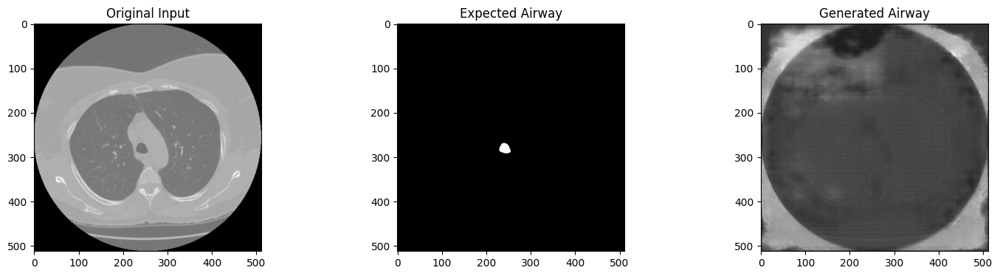

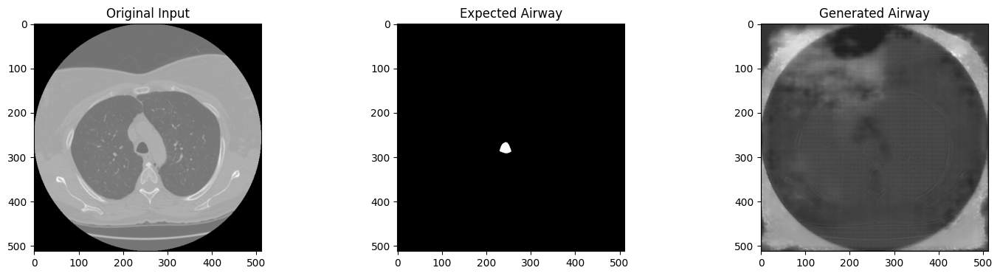

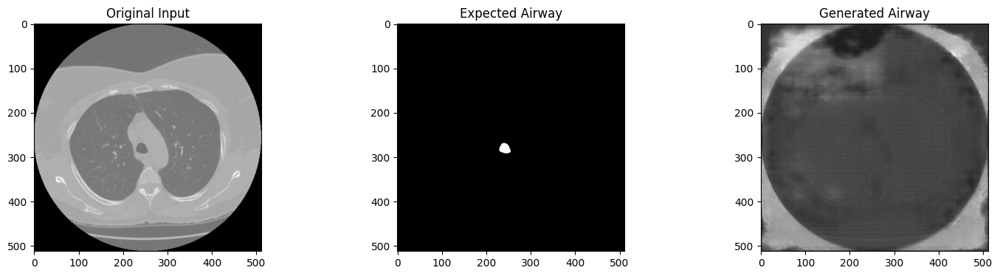

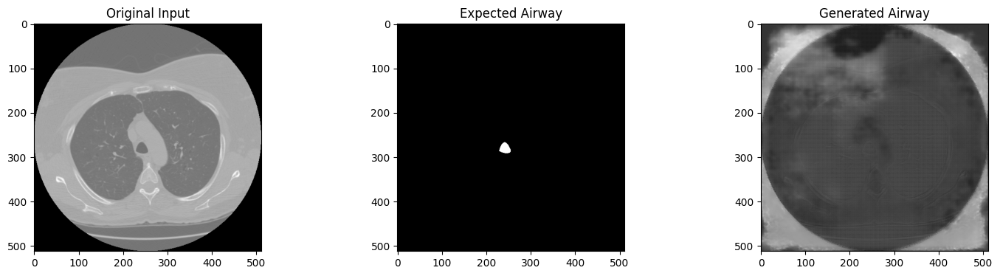

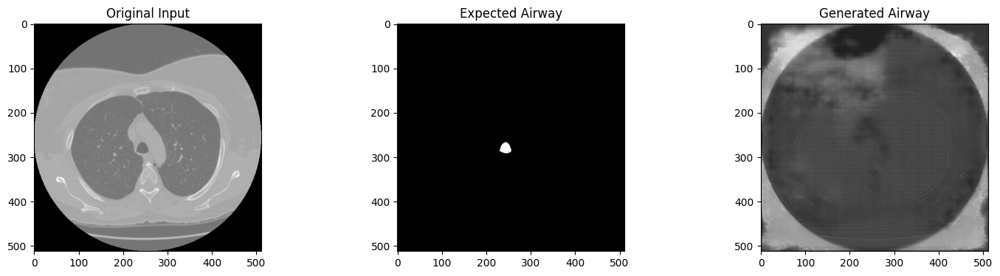

...

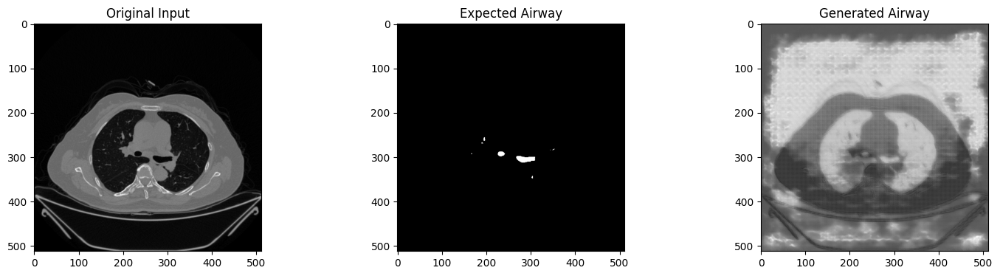

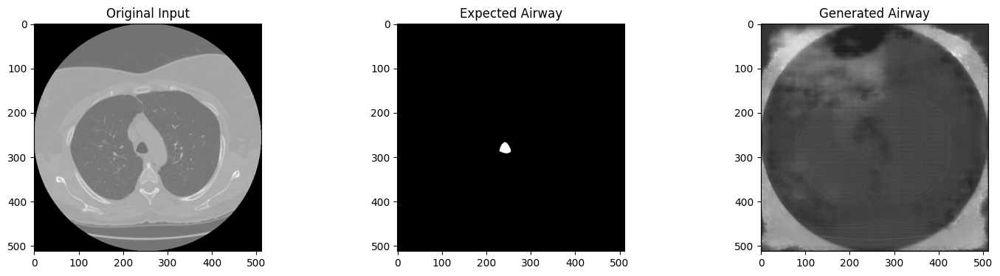

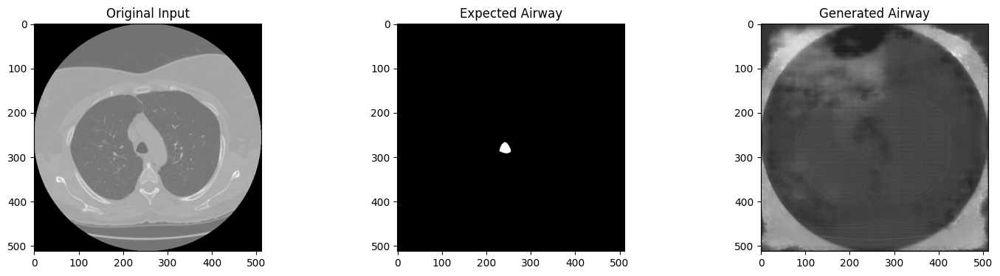

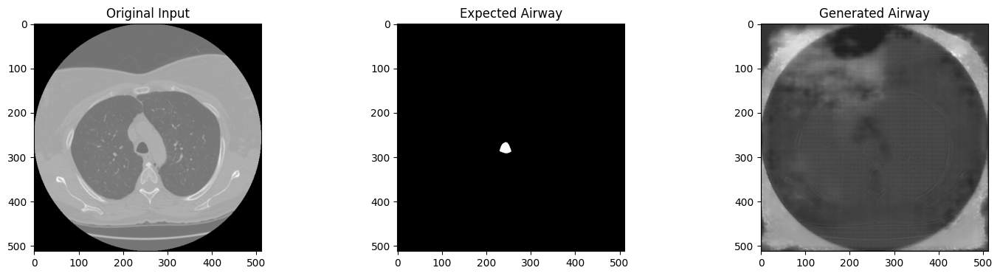

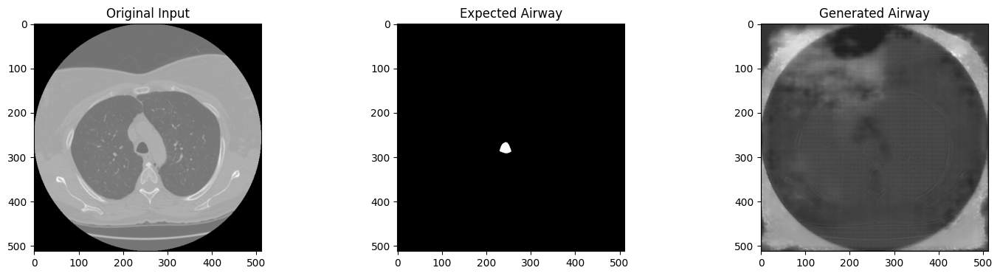

In [20]:
for epoch in range(n_epochs):

    loss_train = run_train_epoch(unet=gen, criterion=criterion, 
                                        data_loader=data_loader_train, unet_opt=unet_opt, 
                                        epoch=epoch,  device=device)

    mean_loss_train_list.append(loss_train)

    loss_validation = run_validation_epoch(unet=gen, criterion=criterion, data_loader=data_loader_validation, epoch=epoch, device=device)

    mean_loss_validation_list.append(loss_validation)

    valid_on_the_fly(unet=gen, data_loader=data_loader_validation, epoch=epoch,save_dir=dir_save_example,device=device)

    if epoch%step_to_safe_save_models == 0:
        torch.save(gen.state_dict(), f"{dir_save_models}{name_model}_last_lr_{unet_scheduler.get_last_lr()[0]}_savesafe.pt")
        with open(dir_save_results+'losses.csv', mode='a', newline='') as file:
            writer = csv.writer(file)
            for i in range(save_count_idx,epoch+1):
                writer.writerow([mean_loss_train_list[i], mean_loss_validation_list[i]])
        save_count_idx = epoch+1

    if epoch >= epoch_to_switch_to_lr_scheduler:
        unet_scheduler.step()
        print("Current learning rate: ", unet_scheduler.get_last_lr()[0])

In [21]:
torch.save(unet.state_dict(), f"{dir_save_models}{name_model}_trained.pt")
if save_count_idx < n_epochs:
    with open(dir_save_results+'losses.csv', mode='a', newline='') as file:
        writer = csv.writer(file)
        for i in range(save_count_idx,epoch+1):
            writer.writerow([mean_loss_train_list[i], mean_loss_validation_list[i]])

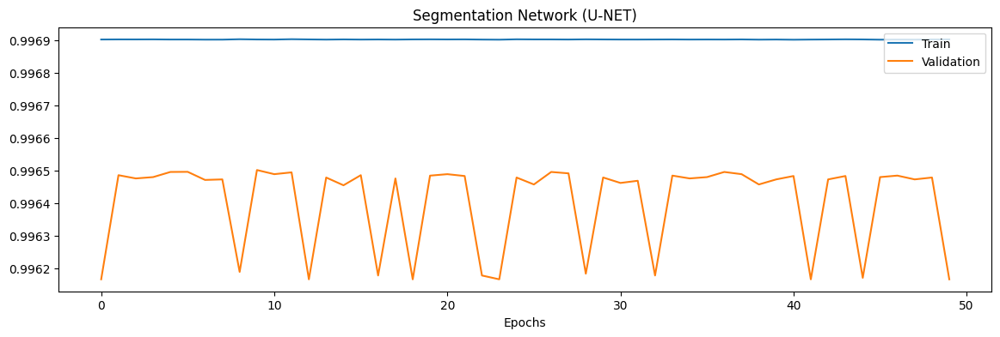

In [22]:
fig,ax = plt.subplots(1,1,figsize=(14,4))
ax.plot(mean_loss_train_list, label= 'Train')
ax.plot(mean_loss_validation_list, label='Validation')
ax.legend(loc='upper right')
ax.set_title('Segmentation Network (U-NET)')
ax.set_xlabel('Epochs')
plt.savefig(dir_save_results+'_losses_evolution.png')

# DICE

In [1]:
def dice_coefficient_score_calculation(pred, label, smooth=1e-5):
    '''
    From: https://github.com/EndoluminalSurgicalVision-IMR/ATM-22-Related-Work/blob/main/evaluation/evaluation_atm_22.py
    '''
    pred = pred.flatten()
    label = label.flatten()
    intersection = np.sum(pred * label)
    dice_coefficient_score = round(((2.0 * intersection + smooth) / (np.sum(pred) + np.sum(label) + smooth)) * 100, 2)
    return dice_coefficient_score

In [28]:
def evaluate_seg_net(model, data_loader_test, dir_save_test):
    print('Generating examples for qualitative analysis...')
    counter = 0
    with torch.no_grad():
        for batch in data_loader_test:
            input_img_batch = batch[0]
            input_airway_batch = batch[1]
            
            input_img = input_img_batch[:1,:,:,:].to(device)
            input_airway = input_airway_batch[:1,:,:].to(device)
            
            gen_seg = model(input_img)
            break

        plt_save_example_airways_img(input_img_ref=input_img[0,0,:,:].detach().cpu().numpy(), 
                                    input_airway_ref=input_airway[0,:,:].detach().cpu().numpy(), 
                                    gen_seg_ref=gen_seg[0,0,:,:].detach().cpu().numpy(), 
                                    epoch=0, 
                                    save_dir=dir_save_test)
        
        print('Calculating DICE...')
        dice =  dice_coefficient_score_calculation(pred=input_airway.detach().cpu().numpy(), label=input_img.detach().cpu().numpy())
        print(dice)

In [13]:
# Ajustar isso aqui para pasta com dados de teste
processed_data_folder = 'C:/Users/julia/OneDrive/Dados_escolinha/data_unet'
batch_size_test = 10

dataset_test = processedCTData(processed_data_folder=processed_data_folder,mode='all_test',start=0, end=100)
data_loader_test= DataLoader(dataset_test, batch_size=batch_size_test, shuffle=True)

In [32]:
dir_save_results = './unet_dice_loss/'
dir_save_test = dir_save_results+'test/'
os.makedirs(dir_save_test, exist_ok=True)

Generating examples for qualitative analysis...
Calculating DICE...
0.53


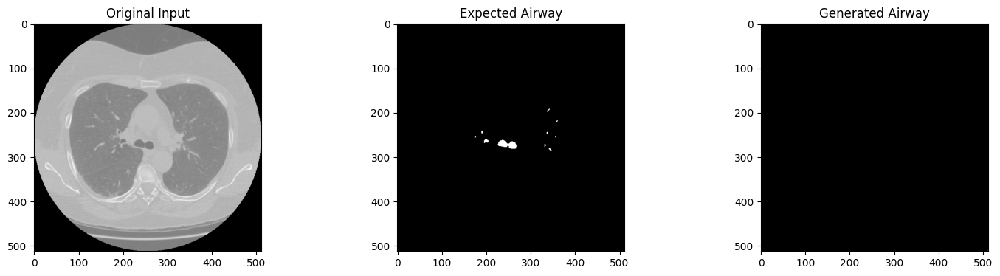

In [33]:
# modelo U-Net sem pesos da GAN
trained_unet_dice_path = './unet_dice_loss/models/unet_dice_loss_trained.pt'

unet_withot_GAN = Generator()
unet_withot_GAN.load_state_dict(torch.load(trained_unet_dice_path, weights_only=True))
unet_withot_GAN.to(device)
unet_withot_GAN.eval()

evaluate_seg_net(model=unet_withot_GAN, data_loader_test=data_loader_test, dir_save_test=dir_save_test)

In [30]:
dir_save_results = './gen_dice_loss/'
dir_save_test = dir_save_results+'test/'
os.makedirs(dir_save_test, exist_ok=True)

Generating examples for qualitative analysis...
Calculating DICE...
0.27


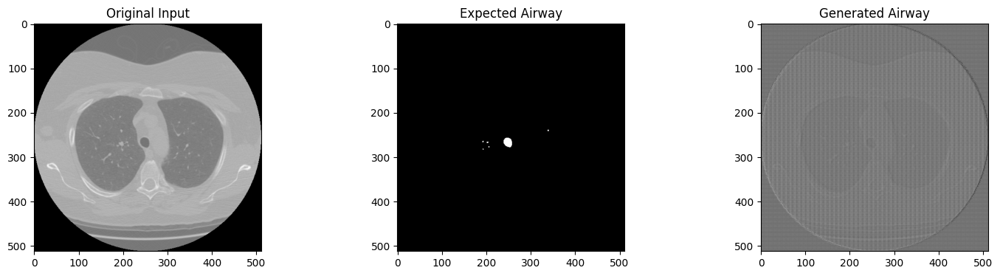

In [31]:
# modelo com pesos da GAN
trained_gen_dice_path = './gen_dice_loss/models/gen_dice_loss_trained.pt'

unet_with_GAN = Generator()
unet_with_GAN.load_state_dict(torch.load(trained_gen_dice_path, weights_only=True))
unet_with_GAN.to(device)
unet_with_GAN.eval()

evaluate_seg_net(model=unet_with_GAN, data_loader_test=data_loader_test, dir_save_test=dir_save_test)